In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.transforms import v2
from transformers import AutoModel
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

PROJECT_LOC = './classifier'
CONFIG = {
    "device": "cuda:3" if torch.cuda.is_available() else "cpu",
    
    # 必須與訓練時一致 (DINOv3 Large)
    "model_name": "facebook/dinov3-vitl16-pretrain-lvd1689m", 
    "img_size": 2400,           # 推論建議先用 1600，若 GPU 夠強可改 2400
    "patch_size": 16,
    "num_classes": 6, 
    "extract_layers": [-1], # 必須與 Fine-tuning 訓練時一致
    # 權重路徑 (指向你 Fine-tuning 產出的全模型權重)
    # "checkpoint_path": "./models_trained/best_finetune.pth",
    "checkpoint_path": "./dinov3/Training_end2end/end2end_5classes_i12_vitl_lastlayer/best_finetune.pth",
    # 測試與輸出路徑
    "test_image_dir": "/home/nas2/Personal/Aaron/temp/sam2_final_output",
    "output_dir": "/home/nas2/Personal/Aaron/temp/sam2_final_outputorgans"
    # "test_image_dir": "/home/nas2/Workspace/Aaron/phal_research/raw_images_0302/sorted_orchids",
    # "output_dir": "/home/nas2/Workspace/Aaron/phal_research/raw_images_0302/organs"
}

# CLASS_COLORS = {
#     0: [0, 0, 0],       # 背景
#     1: [255, 0, 0],     # 花瓣
#     2: [0, 255, 0],     # 花萼上
#     3: [0, 255, 0],     # 花萼下
#     4: [0, 0, 255],     # 唇瓣
#     5: [255, 255, 0]    # 蕊柱
# }
CLASS_COLORS = {
    0: [0, 0, 0],       # 背景 (黑)
    1: [255, 105, 180], # 花瓣 (粉紅)
    2: [144, 238, 144], # 花萼上 (淺綠)
    3: [0, 100, 0],     # 花萼下 (深綠)
    4: [0, 0, 255],     # 唇瓣 (藍)
    5: [255, 255, 0]    # 蕊柱 (黃)
}
CLASS_NAMES = ["Background", "Petal", "Dorsal Sepal", "Lateral Sepal", "Labellum", "Column"]

# ==========================================
# 2. 模型定義 (改為 Fine-tuning 版本架構)
# ==========================================
class FineTuneSegmentation(nn.Module):
    def __init__(self, model_name, num_classes, extract_layers):
        super().__init__()
        self.backbone = AutoModel.from_pretrained(model_name)
        self.extract_layers = extract_layers
        
        self.embed_dim = self.backbone.config.hidden_size 
        self.total_dim = self.embed_dim * len(extract_layers)

        self.head = nn.Sequential(
            nn.BatchNorm2d(self.total_dim),
            nn.Conv2d(self.total_dim, 512, kernel_size=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, num_classes, kernel_size=1)
        )

    def forward(self, x):
        B, C, H, W = x.shape
        # 推論時不需要 gradient checkpointing，直接 forward
        outputs = self.backbone(x, output_hidden_states=True)
        hidden_states = outputs.hidden_states
            
        feats = []
        num_patches = (H // CONFIG['patch_size']) * (W // CONFIG['patch_size'])
        h_patch, w_patch = H // CONFIG['patch_size'], W // CONFIG['patch_size']

        for layer_idx in self.extract_layers:
            feat = hidden_states[layer_idx] 
            # 提取 Spatial tokens (排除 CLS/Registers)
            feat_spatial = feat[:, -num_patches:, :].permute(0, 2, 1)
            feat_spatial = feat_spatial.reshape(B, self.embed_dim, h_patch, w_patch)
            feats.append(feat_spatial)
            
        cat_feats = torch.cat(feats, dim=1)
        logits = self.head(cat_feats)
        return F.interpolate(logits, size=(H, W), mode='bilinear', align_corners=False)

# ==========================================
# 3. 視覺化工具函數 (保持不變)
# ==========================================
def decode_segmap(mask):
    h, w = mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_idx, color in CLASS_COLORS.items():
        rgb[mask == cls_idx] = color
    return rgb

def blend_images(orig_img, seg_rgb, alpha=0.4):
    orig_img = np.array(orig_img)
    if orig_img.shape[:2] != seg_rgb.shape[:2]:
        seg_rgb = cv2.resize(seg_rgb, (orig_img.shape[1], orig_img.shape[0]), interpolation=cv2.INTER_NEAREST)
    return cv2.addWeighted(orig_img, 1 - alpha, seg_rgb, alpha, 0)


# ==========================================
# 4. 主推論流程 (依類別資料夾儲存版)
# ==========================================
def main():
    os.makedirs(CONFIG["output_dir"], exist_ok=True)
    
    # 🌟 新增：建立一個專門存放「依類別分類」的總資料夾
    class_output_dir = os.path.join(CONFIG["output_dir"], "segmented_by_class")
    os.makedirs(class_output_dir, exist_ok=True)
    
    # A. 初始化模型
    model = FineTuneSegmentation(
        CONFIG['model_name'], 
        CONFIG['num_classes'], 
        CONFIG['extract_layers']
    ).to(CONFIG['device'])
    
    # B. 載入權重
    if os.path.exists(CONFIG["checkpoint_path"]):
        print(f"Loading Fine-tuned weights from {CONFIG['checkpoint_path']}")
        checkpoint = torch.load(CONFIG["checkpoint_path"], map_location=CONFIG["device"])
        model.load_state_dict(checkpoint)
    else:
        print(f"Error: Checkpoint not found at {CONFIG['checkpoint_path']}!")
        return

    model.eval()

    # C. 預處理
    transform = v2.Compose([
        v2.Resize((CONFIG['img_size'], CONFIG['img_size']), interpolation=v2.InterpolationMode.BICUBIC),
        v2.PILToTensor(),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    test_files = [f for f in os.listdir(CONFIG["test_image_dir"]) if f.endswith(('.jpg', '.png', '.JPG'))]
    print(f"Total images: {len(test_files)}")

    for img_name in test_files:
        img_path = os.path.join(CONFIG["test_image_dir"], img_name)
        try:
            # 1. 讀取原始帶有透明通道的 RGBA 圖片
            img_rgba = Image.open(img_path).convert("RGBA")
            
            # 2. 建立一張與原圖同等大小的「純黑」底圖
            # 如果你的蘭花很暗，怕混淆，也可以改成純白 (255, 255, 255, 255)
            black_bg = Image.new("RGBA", img_rgba.size, (0, 0, 0, 255))
            
            # 3. 利用 Alpha 通道，把蘭花「貼」在純黑底圖上
            # 這樣原本透明的地方就會真正變成實體的黑色像素
            composite = Image.alpha_composite(black_bg, img_rgba)
            
            # 4. 這時再轉成 RGB 給 DINO，背景就絕對是純黑的了！
            original_pil = composite.convert("RGB")
            
            # 為了後續分割存檔，保留 Numpy 格式的 RGBA
            original_rgba = np.array(img_rgba)
        except Exception as e:
            print(f"[WARN] Failed to read {img_name}: {e}")
            continue
            
        orig_w, orig_h = original_pil.size
        
        # 1. 前處理
        input_tensor = transform(original_pil).unsqueeze(0).to(CONFIG['device'])
        
        # 2. 推論
        with torch.no_grad():
            logits = model(input_tensor)
            pred_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()

        # 3. 後處理 (Resize 回原圖大小)
        pred_mask_orig = cv2.resize(pred_mask.astype('uint8'), (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
        
        # ==========================================
        # 🌟 核心修改：依「類別 (Class)」儲存器官
        # ==========================================
        base_name = os.path.splitext(img_name)[0]
        
        for cls_idx in range(1, 6):
            cls_name = CLASS_NAMES[cls_idx]
            
            # 動態建立該類別的專屬資料夾 (例如: segmented_by_class/Petal)
            specific_cls_dir = os.path.join(class_output_dir, cls_name)
            os.makedirs(specific_cls_dir, exist_ok=True)
            
            binary_mask = (pred_mask_orig == cls_idx)
            
            if not binary_mask.any():
                continue
                
            extracted_part = np.zeros_like(original_rgba)
            extracted_part[binary_mask] = original_rgba[binary_mask]
            
            ys, xs = np.where(binary_mask)
            y1, y2 = ys.min(), ys.max()
            x1, x2 = xs.min(), xs.max()
            cropped_part = extracted_part[y1:y2+1, x1:x2+1]
            
            save_img = cv2.cvtColor(cropped_part, cv2.COLOR_RGBA2BGRA)
            
            # 檔名直接用原圖名稱即可，因為已經被分類在不同的資料夾了
            part_save_path = os.path.join(specific_cls_dir, f"{base_name}.png")
            cv2.imwrite(part_save_path, save_img)
            
        # ==========================================
        # 4 & 5. 視覺化與存檔 
        # ==========================================
        seg_rgb = decode_segmap(pred_mask_orig)
        blended = blend_images(original_pil, seg_rgb)
        
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(original_pil); axes[0].set_title("Original"); axes[0].axis('off')
        
        from matplotlib import colors
        color_list = ['black', '#FF69B4', '#90EE90', '#006400', 'blue', 'yellow']
        cmap = colors.ListedColormap(color_list)
        norm = colors.BoundaryNorm([0, 1, 2, 3, 4, 5, 6], cmap.N)
        
        axes[1].imshow(pred_mask_orig, cmap=cmap, norm=norm, interpolation='nearest')
        axes[1].set_title("Fine-tuned Prediction")
        axes[1].axis('off')
        
        axes[2].imshow(blended); axes[2].set_title("Overlay"); axes[2].axis('off')
        
        patches = [plt.plot([],[], marker="s", ms=10, ls="", color=np.array(CLASS_COLORS[i])/255.0, 
                            label=CLASS_NAMES[i])[0] for i in range(6)]
        axes[1].legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.tight_layout()
        plt.savefig(os.path.join(CONFIG["output_dir"], f"res_{img_name}"), dpi=150)
        plt.close(fig) 
        
        print(f"Processed & Segmented by Class: {img_name}")

if __name__ == "__main__":
    main()

/home/nas2/Workspace/Aaron/server2_envs/SAM/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading weights: 100%|██████████| 415/415 [00:00<00:00, 460.87it/s, Materializing param=norm.weight]                     


Loading Fine-tuned weights from ./dinov3/Training_end2end/end2end_5classes_i12_vitl_lastlayer/best_finetune.pth
Total images: 1
Processed & Segmented by Class: 1J5A1956_final.png


In [2]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.transforms import v2
from transformers import AutoModel
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import zipfile  # 🌟 新增：用於打包 CVAT 格式

PROJECT_LOC = './classifier'
CONFIG = {
    "device": "cuda:0" if torch.cuda.is_available() else "cpu",
    
    # 必須與訓練時一致 (DINOv3 Large)
    "model_name": "facebook/dinov3-vitl16-pretrain-lvd1689m", 
    "img_size": 2400,           # 推論建議先用 1600，若 GPU 夠強可改 2400
    "patch_size": 16,
    "num_classes": 6, 
    "extract_layers": [-1], # 必須與 Fine-tuning 訓練時一致
    # 權重路徑 (指向你 Fine-tuning 產出的全模型權重)
    "checkpoint_path": "./dinov3/Training_end2end/end2end_5classes_i12_vitl_lastlayer/best_finetune.pth",
    # 測試與輸出路徑
    "test_image_dir": "/home/nas2/Workspace/Aaron/phal_research/raw_images_0302/sorted_orchids",
    "output_dir": "/home/nas2/Workspace/Aaron/phal_research/raw_images_0302/organs"
}

CLASS_COLORS = {
    0: [0, 0, 0],       # 背景 (黑)
    1: [255, 105, 180], # 花瓣 (粉紅)
    2: [144, 238, 144], # 花萼上 (淺綠)
    3: [0, 100, 0],     # 花萼下 (深綠)
    4: [0, 0, 255],     # 唇瓣 (藍)
    5: [255, 255, 0]    # 蕊柱 (黃)
}
CLASS_NAMES = ["Background", "Petal", "Dorsal Sepal", "Lateral Sepal", "Labellum", "Column"]

# 🌟 新增：定義 CVAT 專用的 labelmap.txt 內容格式
CVAT_LABELMAP_TEXT = """# label:color_rgb:parts:actions
Background:0,0,0::
Petal:255,105,180::
Dorsal Sepal:144,238,144::
Lateral Sepal:0,100,0::
Labellum:0,0,255::
Column:255,255,0::"""

# ==========================================
# 2. 模型定義 (改為 Fine-tuning 版本架構)
# ==========================================
class FineTuneSegmentation(nn.Module):
    def __init__(self, model_name, num_classes, extract_layers):
        super().__init__()
        self.backbone = AutoModel.from_pretrained(model_name)
        self.extract_layers = extract_layers
        
        self.embed_dim = self.backbone.config.hidden_size 
        self.total_dim = self.embed_dim * len(extract_layers)

        self.head = nn.Sequential(
            nn.BatchNorm2d(self.total_dim),
            nn.Conv2d(self.total_dim, 512, kernel_size=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, num_classes, kernel_size=1)
        )

    def forward(self, x):
        B, C, H, W = x.shape
        # 推論時不需要 gradient checkpointing，直接 forward
        outputs = self.backbone(x, output_hidden_states=True)
        hidden_states = outputs.hidden_states
            
        feats = []
        num_patches = (H // CONFIG['patch_size']) * (W // CONFIG['patch_size'])
        h_patch, w_patch = H // CONFIG['patch_size'], W // CONFIG['patch_size']

        for layer_idx in self.extract_layers:
            feat = hidden_states[layer_idx] 
            # 提取 Spatial tokens (排除 CLS/Registers)
            feat_spatial = feat[:, -num_patches:, :].permute(0, 2, 1)
            feat_spatial = feat_spatial.reshape(B, self.embed_dim, h_patch, w_patch)
            feats.append(feat_spatial)
            
        cat_feats = torch.cat(feats, dim=1)
        logits = self.head(cat_feats)
        return F.interpolate(logits, size=(H, W), mode='bilinear', align_corners=False)

# ==========================================
# 3. 視覺化工具函數
# ==========================================
def decode_segmap(mask):
    h, w = mask.shape
    rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_idx, color in CLASS_COLORS.items():
        rgb[mask == cls_idx] = color
    return rgb

def blend_images(orig_img, seg_rgb, alpha=0.4):
    orig_img = np.array(orig_img)
    if orig_img.shape[:2] != seg_rgb.shape[:2]:
        seg_rgb = cv2.resize(seg_rgb, (orig_img.shape[1], orig_img.shape[0]), interpolation=cv2.INTER_NEAREST)
    return cv2.addWeighted(orig_img, 1 - alpha, seg_rgb, alpha, 0)

# ==========================================
# 4. 主推論流程 
# ==========================================
def main():
    os.makedirs(CONFIG["output_dir"], exist_ok=True)
    
    class_output_dir = os.path.join(CONFIG["output_dir"], "segmented_by_class")
    os.makedirs(class_output_dir, exist_ok=True)
    
    # A. 初始化模型
    model = FineTuneSegmentation(
        CONFIG['model_name'], 
        CONFIG['num_classes'], 
        CONFIG['extract_layers']
    ).to(CONFIG['device'])
    
    # B. 載入權重
    if os.path.exists(CONFIG["checkpoint_path"]):
        print(f"Loading Fine-tuned weights from {CONFIG['checkpoint_path']}")
        checkpoint = torch.load(CONFIG["checkpoint_path"], map_location=CONFIG["device"])
        model.load_state_dict(checkpoint)
    else:
        print(f"Error: Checkpoint not found at {CONFIG['checkpoint_path']}!")
        return

    model.eval()

    # C. 預處理
    transform = v2.Compose([
        v2.Resize((CONFIG['img_size'], CONFIG['img_size']), interpolation=v2.InterpolationMode.BICUBIC),
        v2.PILToTensor(),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    test_files = [f for f in os.listdir(CONFIG["test_image_dir"]) if f.endswith(('.jpg', '.png', '.JPG'))]
    print(f"Total images: {len(test_files)}")

    # 🌟 新增：設定 CVAT 輸出的 ZIP 檔案路徑與檔名清單
    cvat_zip_path = os.path.join(CONFIG["output_dir"], "cvat_annotation.zip")
    image_names_without_ext = []

    # 🌟 新增：開啟 ZIP 寫入流
    with zipfile.ZipFile(cvat_zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        
        # 寫入 CVAT 需要的 labelmap.txt
        zipf.writestr('labelmap.txt', CVAT_LABELMAP_TEXT)

        for img_name in test_files:
            img_path = os.path.join(CONFIG["test_image_dir"], img_name)
            try:
                img_rgba = Image.open(img_path).convert("RGBA")
                black_bg = Image.new("RGBA", img_rgba.size, (0, 0, 0, 255))
                composite = Image.alpha_composite(black_bg, img_rgba)
                original_pil = composite.convert("RGB")
                original_rgba = np.array(img_rgba)
            except Exception as e:
                print(f"[WARN] Failed to read {img_name}: {e}")
                continue
                
            orig_w, orig_h = original_pil.size
            
            # 1. 前處理
            input_tensor = transform(original_pil).unsqueeze(0).to(CONFIG['device'])
            
            # 2. 推論
            with torch.no_grad():
                logits = model(input_tensor)
                pred_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()

            # 3. 後處理 (Resize 回原圖大小)
            pred_mask_orig = cv2.resize(pred_mask.astype('uint8'), (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
            
            # ==========================================
            # 🌟 CVAT 打包處理區塊
            # ==========================================
            base_name = os.path.splitext(img_name)[0]
            image_names_without_ext.append(base_name)
            
            # 呼叫你原本的 decode_segmap 取得 RGB Mask
            cvat_rgb_mask = decode_segmap(pred_mask_orig)
            # 轉成 OpenCV 的 BGR 格式以便正確編碼成 PNG
            cvat_bgr_mask = cv2.cvtColor(cvat_rgb_mask, cv2.COLOR_RGB2BGR)
            
            # 將圖片轉成記憶體二進位格式，直接寫入 ZIP 中的 SegmentationClass/
            _, buffer = cv2.imencode('.png', cvat_bgr_mask)
            zipf.writestr(f"SegmentationClass/{base_name}.png", buffer.tobytes())
            # ==========================================

            # ==========================================
            # 依「類別 (Class)」儲存器官 (保留你的原始邏輯)
            # ==========================================
            for cls_idx in range(1, 6):
                cls_name = CLASS_NAMES[cls_idx]
                
                specific_cls_dir = os.path.join(class_output_dir, cls_name)
                os.makedirs(specific_cls_dir, exist_ok=True)
                
                binary_mask = (pred_mask_orig == cls_idx)
                
                if not binary_mask.any():
                    continue
                    
                extracted_part = np.zeros_like(original_rgba)
                extracted_part[binary_mask] = original_rgba[binary_mask]
                
                ys, xs = np.where(binary_mask)
                y1, y2 = ys.min(), ys.max()
                x1, x2 = xs.min(), xs.max()
                cropped_part = extracted_part[y1:y2+1, x1:x2+1]
                
                save_img = cv2.cvtColor(cropped_part, cv2.COLOR_RGBA2BGRA)
                
                part_save_path = os.path.join(specific_cls_dir, f"{base_name}.png")
                cv2.imwrite(part_save_path, save_img)
                
            # ==========================================
            # 4 & 5. 視覺化與存檔 (保留你的原始邏輯)
            # ==========================================
            seg_rgb = decode_segmap(pred_mask_orig) # 這裡重用剛才的 rgb mask 也行
            blended = blend_images(original_pil, seg_rgb)
            
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))
            axes[0].imshow(original_pil); axes[0].set_title("Original"); axes[0].axis('off')
            
            from matplotlib import colors
            color_list = ['black', '#FF69B4', '#90EE90', '#006400', 'blue', 'yellow']
            cmap = colors.ListedColormap(color_list)
            norm = colors.BoundaryNorm([0, 1, 2, 3, 4, 5, 6], cmap.N)
            
            axes[1].imshow(pred_mask_orig, cmap=cmap, norm=norm, interpolation='nearest')
            axes[1].set_title("Fine-tuned Prediction")
            axes[1].axis('off')
            
            axes[2].imshow(blended); axes[2].set_title("Overlay"); axes[2].axis('off')
            
            patches = [plt.plot([],[], marker="s", ms=10, ls="", color=np.array(CLASS_COLORS[i])/255.0, 
                                label=CLASS_NAMES[i])[0] for i in range(6)]
            axes[1].legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left')

            plt.tight_layout()
            plt.savefig(os.path.join(CONFIG["output_dir"], f"res_{img_name}"), dpi=150)
            plt.close(fig) 
            
            print(f"Processed & Segmented by Class: {img_name}")
            
        # 🌟 迴圈結束後，生成並寫入 default.txt
        default_txt_content = "\n".join(image_names_without_ext)
        zipf.writestr('ImageSets/Segmentation/default.txt', default_txt_content)
        
    print(f"\n✅ CVAT Annotation Zip 已成功儲存至: {cvat_zip_path}")

if __name__ == "__main__":
    main()

Loading weights: 100%|██████████| 415/415 [00:00<00:00, 490.97it/s, Materializing param=norm.weight]                     


Loading Fine-tuned weights from ./dinov3/Training_end2end/end2end_5classes_i12_vitl_lastlayer/best_finetune.pth
Total images: 192
Processed & Segmented by Class: 000_score_-6.12_C1-058_IMG_9327_final.png
Processed & Segmented by Class: 001_score_-6.07_C8-001第三獎_IMG_2634_final.png
Processed & Segmented by Class: 002_score_-5.72_C1-017_1J5A5920_final.png
Processed & Segmented by Class: 003_score_-5.71_C1-094_1J5A4578_final.png
Processed & Segmented by Class: 004_score_-5.64_H5-005第二名_IMG_0763_final.png
Processed & Segmented by Class: 005_score_-5.64_1609_IMG_0763_final.png
Processed & Segmented by Class: 006_score_-5.49_C11-090 SM_1J5A0753_final.png
Processed & Segmented by Class: 007_score_-5.44_C1-017_1J5A6258_final.png
Processed & Segmented by Class: 008_score_-5.42_G1-019_IMG_9865_final.png
Processed & Segmented by Class: 009_score_-5.33_3100_1J5A0242_final.png
Processed & Segmented by Class: 010_score_-5.31_C1-052_IMG_9154_final.png
Processed & Segmented by Class: 011_score_-5.30_C1

In [21]:
import cv2
import numpy as np
import os
from glob import glob

# 1. 設定輸入與輸出的資料夾路徑
input_mask_dir = './raw_images_0302_labeled_7/the7/SegmentationClass'  # CVAT 匯出的 RGB 遮罩資料夾
output_mask_dir = './raw_images_0302_labeled_7/the7masks'        # 轉換後要存放 Index 遮罩的資料夾
os.makedirs(output_mask_dir, exist_ok=True)

# 2. 定義 RGB 到 類別 ID 的對應字典 (請務必根據你的 labelmap.txt 修改)
# 注意格式為 (R, G, B): Class_ID
color2id = {
    (0, 0, 0): 0,       # background (背景)
    (223, 71, 227): 1,  # Column (蕊柱)
    (227, 202, 154): 2, # Dorsal Sepal (上萼片)
    (182, 57, 54): 3,   # Labellum (唇瓣)
    (221, 124, 222): 4, # Lateral Sepal (側萼片)
    (128, 218, 69): 5,  # Petal (花瓣)
    (220, 10, 171): 6,  # Petal_L (左花瓣)
    (58, 154, 209): 7   # Petal_R (右花瓣)
}

# Column:223,71,227::
# Dorsal Sepal:227,202,154::
# Labellum:182,57,54::
# Lateral Sepal:221,124,222::
# Petal:128,218,69::
# Petal_L:220,10,171::
# Petal_R:58,154,209::
# background:0,0,0::
# 3. 開始批次轉換
mask_paths = glob(os.path.join(input_mask_dir, '*.png'))

for path in mask_paths:
    # 讀取 RGB 遮罩
    rgb_mask = cv2.imread(path, cv2.IMREAD_COLOR)
    # OpenCV 讀取時預設是 BGR 通道，我們將它轉為 RGB 以方便與字典對齊
    rgb_mask = cv2.cvtColor(rgb_mask, cv2.COLOR_BGR2RGB)
    
    # 建立一個與原圖同長寬、純黑的單通道矩陣 (預設全部填滿 0，也就是背景)
    height, width = rgb_mask.shape[:2]
    class_mask = np.zeros((height, width), dtype=np.uint8)
    
    # 根據字典，將特定的 RGB 像素替換成對應的 Class ID
    for rgb, class_id in color2id.items():
        # 尋找符合該 RGB 顏色的所有像素位置
        matches = np.all(rgb_mask == rgb, axis=-1)
        # 將這些位置的值寫入類別 ID
        class_mask[matches] = class_id
        
    # 儲存轉換後的遮罩
    filename = os.path.basename(path)
    output_path = os.path.join(output_mask_dir, filename)
    cv2.imwrite(output_path, class_mask)

print(f"成功轉換 {len(mask_paths)} 張遮罩！")

成功轉換 7 張遮罩！


# Show Segmentation

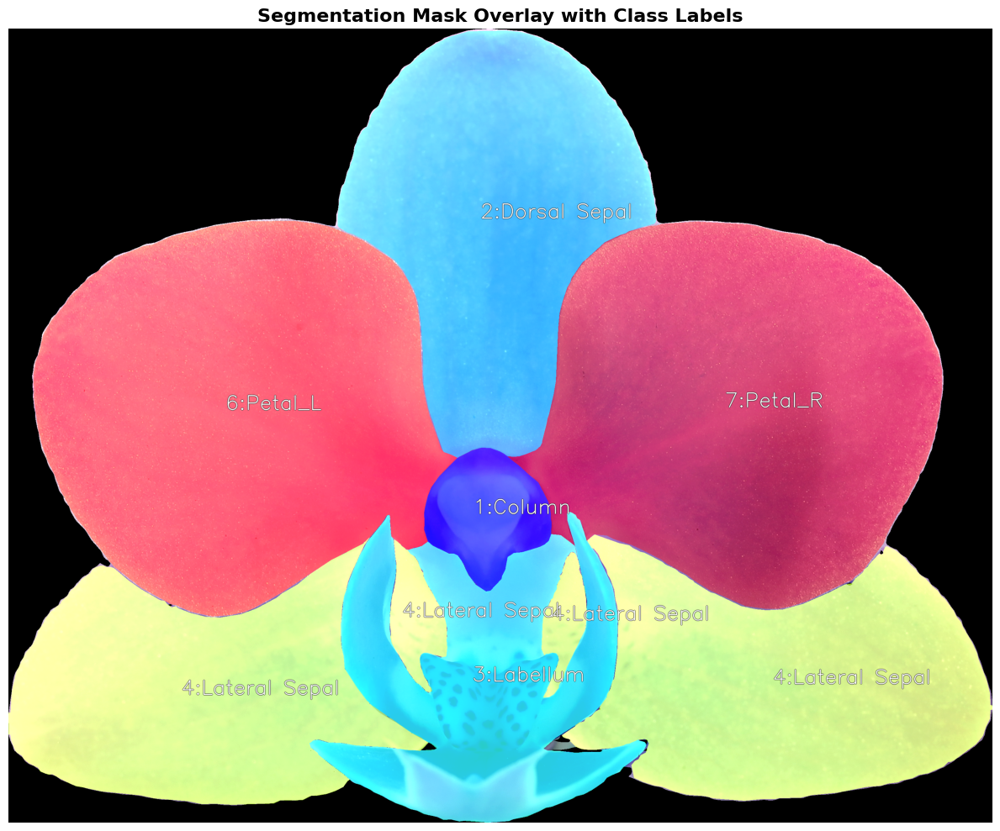

In [76]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. 設定路徑與類別字典
# ==========================================

image_path = './raw_images_0302_labeled_7/the7images/000_009_image.png' 
mask_path = './raw_images_0302_labeled_7/the7masks/000_009_mask.png'

# 定義你的 ID 與 Class Name 對應字典
class_mapping = {
    1: "Column",
    2: "Dorsal Sepal",
    3: "Labellum",
    4: "Lateral Sepal",
    5: "Petal",
    6: "Petal_L",
    7: "Petal_R"
}

# ==========================================
# 2. 讀取影像與遮罩 (含安全檢查)
# ==========================================
img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
if img_rgba is None:
    raise FileNotFoundError("找不到原圖，請確認路徑與格式。")

channels = img_rgba.shape[2] if len(img_rgba.shape) == 3 else 1
if channels == 3:
    img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_BGR2RGBA)
elif channels == 1:
    img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_GRAY2RGBA)

mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
if mask is None:
    raise FileNotFoundError("找不到 Mask，請確認路徑。")

if img_rgba.shape[:2] != mask.shape[:2]:
    raise ValueError(f"尺寸不符！原圖尺寸 {img_rgba.shape[:2]} 與 Mask 尺寸 {mask.shape[:2]} 不一致。")

# ==========================================
# 3. 製作彩色疊合圖 (Overlay)
# ==========================================
# 取得底層 RGB 影像
img_rgb_content = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)

# 替 Mask 上色 (使用 JET 熱色圖)
max_id = np.max(mask) if np.max(mask) > 0 else 1
mask_normalized = (mask * (255 // max_id)).astype(np.uint8)
mask_colored = cv2.applyColorMap(mask_normalized, cv2.COLORMAP_JET)
mask_colored = cv2.cvtColor(mask_colored, cv2.COLOR_BGR2RGB)

# 進行影像疊加 (原圖 60%, 遮罩 40%)
overlay_img = cv2.addWeighted(img_rgb_content, 0.6, mask_colored, 0.8, 0)
# 背景 (ID=0) 不上色
overlay_img[mask == 0] = img_rgb_content[mask == 0]

# ==========================================
# 4. 尋找各區塊幾何中心點，並加上文字標示
# ==========================================
for class_id, class_name in class_mapping.items():
    # 獨立出當前類別的 Binary Mask
    binary_mask = np.where(mask == class_id, 255, 0).astype(np.uint8)
    
    # 尋找輪廓
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        # 過濾太小的雜訊區塊
        if cv2.contourArea(cnt) < 100:
            continue
            
        # 計算幾何矩 (Image Moments) 以取得中心點
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            
            # 準備文字內容
            text = f"{class_id}:{class_name}"
            
            # 設定字體參數
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 2  # 可依圖片大小調整文字比例
            thickness = 2
            
            # 為了讓文字在各種顏色的背景上都清楚，我們畫兩層：先畫黑色粗外框，再畫白色實心字
            # 1. 畫黑色外框線 (粗細加倍)
            cv2.putText(overlay_img, text, (cX - 40, cY), font, font_scale, (0, 0, 0), thickness + 2, cv2.LINE_AA)
            # 2. 畫白色文字
            cv2.putText(overlay_img, text, (cX - 40, cY), font, font_scale, (255, 255, 255), thickness, cv2.LINE_AA)

# ==========================================
# 5. 顯示單圖結果
# ==========================================
plt.figure(figsize=(12, 12))
plt.imshow(overlay_img)
plt.title("Segmentation Mask Overlay with Class Labels", fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

## the soildity

原圖成功讀取，尺寸: (2801, 3388), 通道數: 4

--- 類別 ID 7 的計算結果 (基於處理後的遮罩) ---
物件 1:
  - 處理後輪廓面積: 2609505.5
  - 凸包面積: 2765845.0
  - 凸包比 (Solidity): 0.9435


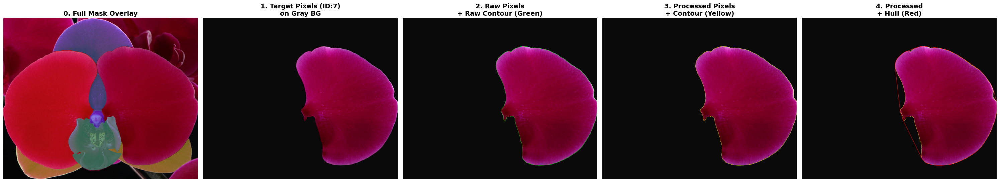

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. 讀取影像與遮罩 (請替換成你的實際檔案路徑)
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/002_image.png' # 原圖
mask_path = './raw_images_0302_labeled_7/the7masks/002_mask.png'   # 轉換好的 1D Index Mask

# 【🌟修正】使用 cv2.IMREAD_UNCHANGED 讀取完整的 RGBA 4 通道
img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
if img_rgba is None:
    raise FileNotFoundError("找不到原圖，請確認路徑與格式。")

# 檢查通道數
channels = img_rgba.shape[2] if len(img_rgba.shape) == 3 else 1
print(f"原圖成功讀取，尺寸: {img_rgba.shape[:2]}, 通道數: {channels}")

if channels != 4:
    print("⚠️ 警告：原圖似乎不具備 4 個通道 (沒有 Alpha 通道)。")
    # 如果不是 4 通道，這裡做個備案，將其轉為 RGBA 方便後續統一處理
    if channels == 3:
        img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_BGR2RGBA)
    else:
        # 單通道灰階轉 RGBA
        img_gray = cv2.cvtColor(img_rgba, cv2.COLOR_GRAY2RGBA)

# 讀取 1D Mask (灰階模式)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
if mask is None:
    raise FileNotFoundError("找不到 Mask，請確認路徑。")

# ==========================================
# 2. 嚴格檢查尺寸機制 (不一樣就 Error)
# ==========================================
if img_rgba.shape[:2] != mask.shape[:2]:
    # 直接 Throw Error 終止程式
    raise ValueError(f"尺寸不符錯誤！原圖尺寸 {img_rgba.shape[:2]} 與 Mask 尺寸 {mask.shape[:2]} 不一致，請重新檢查資料集。")

# 設定目標類別 ID (例如 7)
target_class_id = 7

# ==========================================
# 3. 準備視覺化背景與全局融合圖
# ==========================================
# 分離 RGBA，取得 RGB 內容
img_rgb_content = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)

# --- 🌟 新增需求：全 Mask 與原圖融合 ---
# 將 Mask 的 0~7 ID 放大到 0~255，再套用熱色圖，讓不同 ID 有不同顏色
max_id = np.max(mask) if np.max(mask) > 0 else 1
mask_normalized = (mask * (255 // max_id)).astype(np.uint8)
mask_colored = cv2.applyColorMap(mask_normalized, cv2.COLORMAP_JET)
mask_colored = cv2.cvtColor(mask_colored, cv2.COLOR_BGR2RGB) # 轉回 RGB 供 matplotlib 顯示

# 將彩色 Mask 疊加到原圖上 (原圖佔 60%，Mask 佔 40%)
img_0 = cv2.addWeighted(img_rgb_content, 0.6, mask_colored, 0.4, 0)
# 為了美觀，讓背景 (ID=0) 的區域不要上色，完全顯示原圖
img_0[mask == 0] = img_rgb_content[mask == 0]

# 建立一個與原圖同大小的深灰色背景 (RGB 10, 10, 10)
height, width = img_rgba.shape[:2]
neutral_gray_bg = np.full((height, width, 3), 10, dtype=np.uint8)

# ==========================================
# 4. 形態學運算與準備遮罩
# ==========================================
# 提取原始的 Binary Mask
raw_binary_mask = np.where(mask == target_class_id, 255, 0).astype(np.uint8)

# 定義形態學運算 Kernel
kernel = np.ones((5, 5), np.uint8)
processed_mask = cv2.morphologyEx(raw_binary_mask, cv2.MORPH_CLOSE, kernel)
processed_mask = cv2.morphologyEx(processed_mask, cv2.MORPH_OPEN, kernel)

# ==========================================
# 5. 製作另外 4 張視覺化影像
# ==========================================
# 輔助函式：將 Mask 範圍內的 RGB 像素貼到灰色背景上
def get_masked_overlay(bg_gray, rgb_img, mask_255):
    alpha_mask = mask_255.astype(float) / 255.0
    alpha_mask_3ch = cv2.merge([alpha_mask, alpha_mask, alpha_mask])
    
    foreground = cv2.multiply(rgb_img.astype(float), alpha_mask_3ch)
    background = cv2.multiply(bg_gray.astype(float), 1.0 - alpha_mask_3ch)
    return cv2.add(foreground, background).astype(np.uint8)

# --- 需求 1: 只有顯示 target_class_id 的像素 ---
img_1 = get_masked_overlay(neutral_gray_bg, img_rgb_content, raw_binary_mask)

# --- 需求 2: target_class_id 像素 + 原始 Contour ---
img_2 = img_1.copy()
raw_contours, _ = cv2.findContours(raw_binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(img_2, raw_contours, -1, (0, 255, 0), 2) 

# --- 需求 3: 經過影像處理的 target 像素 + 處理後的 Contour ---
img_3 = get_masked_overlay(neutral_gray_bg, img_rgb_content, processed_mask)
processed_contours, _ = cv2.findContours(processed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(img_3, processed_contours, -1, (255, 255, 0), 2)

# --- 需求 4: 處理後的影像 + Contour + Convex Hull (並計算數值) ---
img_4 = img_3.copy()
cv2.drawContours(img_4, processed_contours, -1, (255, 255, 0), 2) 

print(f"\n--- 類別 ID {target_class_id} 的計算結果 (基於處理後的遮罩) ---")
for i, cnt in enumerate(processed_contours):
    area = cv2.contourArea(cnt)
    if area < 50: continue
        
    hull = cv2.convexHull(cnt)
    hull_area = cv2.contourArea(hull)
    
    if hull_area > 0:
        solidity = area / float(hull_area)
        print(f"物件 {i+1}:")
        print(f"  - 處理後輪廓面積: {area:.1f}")
        print(f"  - 凸包面積: {hull_area:.1f}")
        print(f"  - 凸包比 (Solidity): {solidity:.4f}")
        cv2.drawContours(img_4, [hull], -1, (255, 0, 0), 3)

# ==========================================
# 6. 使用 Matplotlib 並排顯示 5 張圖
# ==========================================
# 將畫布拉長以容納 5 張圖
fig, axes = plt.subplots(1, 5, figsize=(30, 6))
titles = [
    "0. Full Mask Overlay",
    f"1. Target Pixels (ID:{target_class_id})\non Gray BG", 
    "2. Raw Pixels\n+ Raw Contour (Green)", 
    "3. Processed Pixels\n+ Contour (Yellow)", 
    "4. Processed\n+ Hull (Red)"
]
images = [img_0, img_1, img_2, img_3, img_4]

for ax, img_display, title in zip(axes, images, titles):
    ax.imshow(img_display)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.show()

原圖成功讀取，尺寸: (3662, 4418), 通道數: 4

--- 類別 ID 7 的凹陷缺陷 (Convexity Defects) 分析 ---


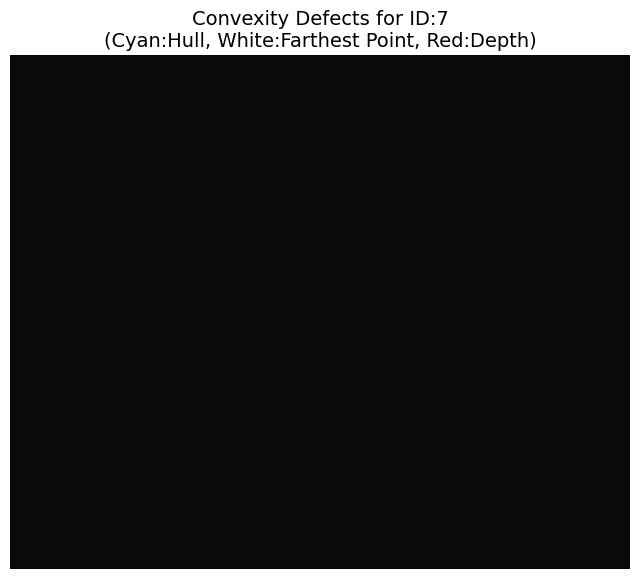

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. 讀取影像與遮罩 (請替換成你的實際檔案路徑)
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/085_image.png' # 原圖
mask_path = './raw_images_0302_labeled_7/the7masks/085_mask.png'   # 轉換好的 1D Index Mask

# 【🌟修正】使用 cv2.IMREAD_UNCHANGED 讀取完整的 RGBA 4 通道
img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
if img_rgba is None:
    raise FileNotFoundError("找不到原圖，請確認路徑與格式。")

# 檢查通道數
channels = img_rgba.shape[2] if len(img_rgba.shape) == 3 else 1
print(f"原圖成功讀取，尺寸: {img_rgba.shape[:2]}, 通道數: {channels}")

if channels != 4:
    print("⚠️ 警告：原圖似乎不具備 4 個通道 (沒有 Alpha 通道)。")
    # 如果不是 4 通道，這裡做個備案，將其轉為 RGBA 方便後續統一處理
    if channels == 3:
        img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_BGR2RGBA)
    else:
        # 單通道灰階轉 RGBA
        img_gray = cv2.cvtColor(img_rgba, cv2.COLOR_GRAY2RGBA)

# 讀取 1D Mask (灰階模式)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
if mask is None:
    raise FileNotFoundError("找不到 Mask，請確認路徑。")

# ==========================================
# 2. 嚴格檢查尺寸機制 (不一樣就 Error)
# ==========================================
if img_rgba.shape[:2] != mask.shape[:2]:
    # 直接 Throw Error 終止程式
    raise ValueError(f"尺寸不符錯誤！原圖尺寸 {img_rgba.shape[:2]} 與 Mask 尺寸 {mask.shape[:2]} 不一致，請重新檢查資料集。")

# 設定目標類別 ID (例如 7)
target_class_id = 7

# ==========================================
# 3. 準備視覺化背景與全局融合圖
# ==========================================
# 分離 RGBA，取得 RGB 內容
img_rgb_content = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)

# --- 🌟 新增需求：全 Mask 與原圖融合 ---
# 將 Mask 的 0~7 ID 放大到 0~255，再套用熱色圖，讓不同 ID 有不同顏色
max_id = np.max(mask) if np.max(mask) > 0 else 1
mask_normalized = (mask * (255 // max_id)).astype(np.uint8)
mask_colored = cv2.applyColorMap(mask_normalized, cv2.COLORMAP_JET)
mask_colored = cv2.cvtColor(mask_colored, cv2.COLOR_BGR2RGB) # 轉回 RGB 供 matplotlib 顯示

# 將彩色 Mask 疊加到原圖上 (原圖佔 60%，Mask 佔 40%)
img_0 = cv2.addWeighted(img_rgb_content, 0.6, mask_colored, 0.4, 0)
# 為了美觀，讓背景 (ID=0) 的區域不要上色，完全顯示原圖
img_0[mask == 0] = img_rgb_content[mask == 0]

# 建立一個與原圖同大小的深灰色背景 (RGB 10, 10, 10)
height, width = img_rgba.shape[:2]
neutral_gray_bg = np.full((height, width, 3), 10, dtype=np.uint8)

# ==========================================
# 4. 形態學運算與準備遮罩
# ==========================================
# 提取原始的 Binary Mask
raw_binary_mask = np.where(mask == target_class_id, 255, 0).astype(np.uint8)

# 定義形態學運算 Kernel
kernel = np.ones((5, 5), np.uint8)
processed_mask = cv2.morphologyEx(raw_binary_mask, cv2.MORPH_CLOSE, kernel)
processed_mask = cv2.morphologyEx(processed_mask, cv2.MORPH_OPEN, kernel)
# 建立一個新的視覺化畫布，疊加在灰背景上
img_defects = get_masked_overlay(neutral_gray_bg, img_rgb_content, processed_mask)

print(f"\n--- 類別 ID {target_class_id} 的凹陷缺陷 (Convexity Defects) 分析 ---")

for i, cnt in enumerate(processed_contours):
    area = cv2.contourArea(cnt)
    if area < 50: continue
        
    # 🌟 關鍵步驟 1: 尋找凸包，但必須返回索引 (returnPoints=False)
    # 這是計算 defects 所必需的格式
    hull_indices = cv2.convexHull(cnt, returnPoints=False)
    
    # 🌟 關鍵步驟 2: 計算凹陷缺陷
    # 返回一個陣列 [start_idx, end_idx, farthest_idx, distance]
    defects = cv2.convexityDefects(cnt, hull_indices)
    
    if defects is None:
        print(f"物件 {i+1}: 沒有明顯的凹陷缺陷。")
        continue

    print(f"物件 {i+1}: 找到 {defects.shape[0]} 個顯著的凹陷點")
    
    max_depth = 0
    
    # 🌟 關鍵步驟 3: 視覺化與計算深度
    for j in range(defects.shape[0]):
        s_idx, e_idx, f_idx, d = defects[j, 0]
        
        # 取得輪廓上的點
        start = tuple(cnt[s_idx][0])
        end = tuple(cnt[e_idx][0])
        far = tuple(cnt[f_idx][0])
        
        # d 是深度 (distance)，它放大到了像素值的 256 倍，需要除以 256
        depth = d / 256.0
        if depth > max_depth:
            max_depth = depth
            
        # --- 視覺化 ---
        # 畫上凸包連線 (青色)
        cv2.line(img_defects, start, end, (0, 255, 255), 20)
        # 畫上凹陷最深點 (白色圓點)
        cv2.circle(img_defects, far, 20, (255, 255, 255), -1)
        # 畫上從凸包連線到最深點的深度線 (紅色)
        cv2.line(img_defects, far, start, (0, 0, 255), 10)

    print(f"  - 最大凹陷深度 (像素): {max_depth:.2f}\n")

# ==========================================
# 視覺化顯示
# ==========================================
plt.figure(figsize=(8, 8))
plt.imshow(img_defects)
plt.title(f"Convexity Defects for ID:{target_class_id}\n(Cyan:Hull, White:Farthest Point, Red:Depth)", fontsize=14)
plt.axis('off')
plt.show()

原圖成功讀取，尺寸: (3133, 3498), 通道數: 4

--- 類別 ID 7 的計算結果 (排除 Class 2, 3 遮擋區域) ---
物件 1:
  - 修補後輪廓面積: 3051451.0
  - 修補後凸包面積: 3119413.0
  - 凸包比 (Solidity): 0.9782


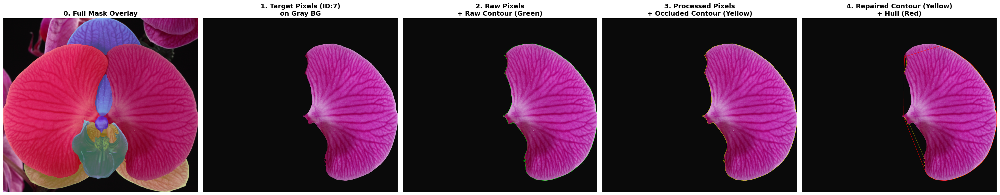

In [69]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. 讀取影像與遮罩
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/000_image.png' 
mask_path = './raw_images_0302_labeled_7/the7masks/000_mask.png'   

img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
if img_rgba is None:
    raise FileNotFoundError("找不到原圖，請確認路徑與格式。")

channels = img_rgba.shape[2] if len(img_rgba.shape) == 3 else 1
print(f"原圖成功讀取，尺寸: {img_rgba.shape[:2]}, 通道數: {channels}")

if channels != 4:
    print("⚠️ 警告：原圖似乎不具備 4 個通道 (沒有 Alpha 通道)。")
    if channels == 3:
        img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_BGR2RGBA)
    else:
        img_gray = cv2.cvtColor(img_rgba, cv2.COLOR_GRAY2RGBA)

mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
if mask is None:
    raise FileNotFoundError("找不到 Mask，請確認路徑。")

# ==========================================
# 2. 嚴格檢查尺寸機制
# ==========================================
if img_rgba.shape[:2] != mask.shape[:2]:
    raise ValueError(f"尺寸不符錯誤！原圖尺寸 {img_rgba.shape[:2]} 與 Mask 尺寸 {mask.shape[:2]} 不一致。")

# 設定目標類別 ID (例如 7)
target_class_id = 7

# ==========================================
# 3. 準備視覺化背景與全局融合圖
# ==========================================
img_rgb_content = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)

max_id = np.max(mask) if np.max(mask) > 0 else 1
mask_normalized = (mask * (255 // max_id)).astype(np.uint8)
mask_colored = cv2.applyColorMap(mask_normalized, cv2.COLORMAP_JET)
mask_colored = cv2.cvtColor(mask_colored, cv2.COLOR_BGR2RGB) 

img_0 = cv2.addWeighted(img_rgb_content, 0.6, mask_colored, 0.4, 0)
img_0[mask == 0] = img_rgb_content[mask == 0]

height, width = img_rgba.shape[:2]
neutral_gray_bg = np.full((height, width, 3), 10, dtype=np.uint8)

# ==========================================
# 4. 形態學運算與【🌟新增：遮擋區計算】
# ==========================================
# 提取原始的 Binary Mask
raw_binary_mask = np.where(mask == target_class_id, 255, 0).astype(np.uint8)

# 定義形態學運算 Kernel
kernel = np.ones((5, 5), np.uint8)
processed_mask = cv2.morphologyEx(raw_binary_mask, cv2.MORPH_CLOSE, kernel)
processed_mask = cv2.morphologyEx(processed_mask, cv2.MORPH_OPEN, kernel)

# 🌟 建立遮擋區的 Mask (Class 2 & 3)
occlusion_mask = np.where((mask == 2) | (mask == 3), 255, 0).astype(np.uint8)
# 將遮擋區稍微「膨脹」，確保能涵蓋到目標物件邊界上的接壤點
occ_kernel = np.ones((50, 50), np.uint8)
occlusion_zone = cv2.dilate(occlusion_mask, occ_kernel, iterations=1)

# ==========================================
# 5. 製作另外 4 張視覺化影像與【🌟過濾輪廓點】
# ==========================================
def get_masked_overlay(bg_gray, rgb_img, mask_255):
    alpha_mask = mask_255.astype(float) / 255.0
    alpha_mask_3ch = cv2.merge([alpha_mask, alpha_mask, alpha_mask])
    
    foreground = cv2.multiply(rgb_img.astype(float), alpha_mask_3ch)
    background = cv2.multiply(bg_gray.astype(float), 1.0 - alpha_mask_3ch)
    return cv2.add(foreground, background).astype(np.uint8)

img_1 = get_masked_overlay(neutral_gray_bg, img_rgb_content, raw_binary_mask)

img_2 = img_1.copy()
raw_contours, _ = cv2.findContours(raw_binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(img_2, raw_contours, -1, (0, 255, 0), 2) 

# 圖 3 顯示「包含遮擋凹陷」的原始處理後輪廓
img_3 = get_masked_overlay(neutral_gray_bg, img_rgb_content, processed_mask)
processed_contours, _ = cv2.findContours(processed_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(img_3, processed_contours, -1, (255, 255, 0), 2)

# 圖 4 將用來顯示「剔除遮擋點後，自動修補」的輪廓與凸包
img_4 = get_masked_overlay(neutral_gray_bg, img_rgb_content, processed_mask)

print(f"\n--- 類別 ID {target_class_id} 的計算結果 (排除 Class 2, 3 遮擋區域) ---")
for i, cnt in enumerate(processed_contours):
    
    # 🌟 新增：過濾掉落在 occlusion_zone 內的輪廓點
    filtered_pts = []
    for pt in cnt:
        x, y = pt[0]
        # 如果該點所在的座標，在遮擋區內的值為 0 (代表沒碰到 class 2,3)
        if occlusion_zone[y, x] == 0:
            filtered_pts.append(pt)
            
    filtered_cnt = np.array(filtered_pts)
    
    # 如果過濾後剩下的點太少 (例如整個物件都被包圍)，無法構成多邊形則跳過
    if len(filtered_cnt) < 3:
        print(f"物件 {i+1}: 點數過少，略過。")
        continue

    # 計算「修補後」的面積與凸包
    area = cv2.contourArea(filtered_cnt)
    if area < 50: continue
        
    hull = cv2.convexHull(filtered_cnt)
    hull_area = cv2.contourArea(hull)
    
    if hull_area > 0:
        solidity = area / float(hull_area)
        print(f"物件 {i+1}:")
        print(f"  - 修補後輪廓面積: {area:.1f}")
        print(f"  - 修補後凸包面積: {hull_area:.1f}")
        print(f"  - 凸包比 (Solidity): {solidity:.4f}")
        
        # 在圖 4 畫上修補後的輪廓 (黃色) 與凸包 (紅色)
        cv2.drawContours(img_4, [filtered_cnt], -1, (255, 255, 0), 2)
        cv2.drawContours(img_4, [hull], -1, (255, 0, 0), 3)

# ==========================================
# 6. 使用 Matplotlib 並排顯示 5 張圖
# ==========================================
fig, axes = plt.subplots(1, 5, figsize=(30, 6))
titles = [
    "0. Full Mask Overlay",
    f"1. Target Pixels (ID:{target_class_id})\non Gray BG", 
    "2. Raw Pixels\n+ Raw Contour (Green)", 
    "3. Processed Pixels\n+ Occluded Contour (Yellow)", 
    "4. Repaired Contour (Yellow)\n+ Hull (Red)"
]
images = [img_0, img_1, img_2, img_3, img_4]

for ax, img_display, title in zip(axes, images, titles):
    ax.imshow(img_display)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.show()


--- 類別 ID 7 計算結果 (排除最靠近 Class 1 的 ±15% 邊緣) ---
物件 1:
  - 總輪廓點數: 3379, 剔除基部點數: 67
  - 修剪後輪廓面積: 2972306.0
  - 修剪後凸包面積: 3175018.0
  - 新的凸包比 (Solidity): 0.9362


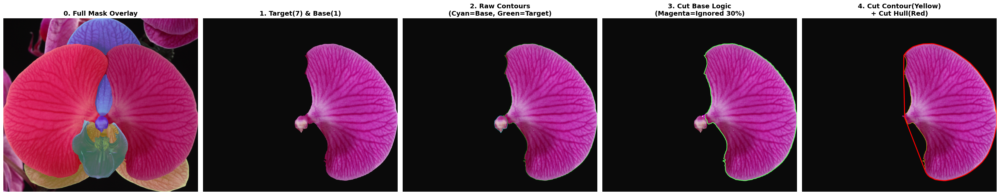

In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. 讀取影像與遮罩
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/000_image.png' 
mask_path = './raw_images_0302_labeled_7/the7masks/000_mask.png'   

img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
if img_rgba is None:
    raise FileNotFoundError("找不到原圖，請確認路徑與格式。")

channels = img_rgba.shape[2] if len(img_rgba.shape) == 3 else 1
if channels == 3:
    img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_BGR2RGBA)
elif channels == 1:
    img_gray = cv2.cvtColor(img_rgba, cv2.COLOR_GRAY2RGBA)

mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
if mask is None:
    raise FileNotFoundError("找不到 Mask。")

if img_rgba.shape[:2] != mask.shape[:2]:
    raise ValueError(f"尺寸不符錯誤！")

# 設定目標類別 (7:花瓣) 與 參考基準類別 (1:柱頭)
target_class_id = 7
base_class_id = 1

# ==========================================
# 2. 準備視覺化背景
# ==========================================
img_rgb_content = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)
height, width = img_rgba.shape[:2]
neutral_gray_bg = np.full((height, width, 3), 10, dtype=np.uint8)

# 製作全圖疊加 (img_0)
max_id = np.max(mask) if np.max(mask) > 0 else 1
mask_normalized = (mask * (255 // max_id)).astype(np.uint8)
mask_colored = cv2.applyColorMap(mask_normalized, cv2.COLORMAP_JET)
mask_colored = cv2.cvtColor(mask_colored, cv2.COLOR_BGR2RGB) 
img_0 = cv2.addWeighted(img_rgb_content, 0.6, mask_colored, 0.4, 0)
img_0[mask == 0] = img_rgb_content[mask == 0]

# ==========================================
# 3. 提取 Class 1 (柱頭) 與 Class 7 (花瓣)
# ==========================================
# 提取柱頭 (Class 1) 的像素並尋找輪廓點
mask_c1 = np.where(mask == base_class_id, 255, 0).astype(np.uint8)
cnts_c1, _ = cv2.findContours(mask_c1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# 將 Class 1 的所有輪廓點攤平成一個大陣列，方便後續計算距離
c1_points = np.vstack(cnts_c1) if cnts_c1 else None

# 提取花瓣 (Class 7) 的像素 (加上輕微去雜訊)
mask_c7 = np.where(mask == target_class_id, 255, 0).astype(np.uint8)
kernel = np.ones((5, 5), np.uint8)
mask_c7 = cv2.morphologyEx(mask_c7, cv2.MORPH_OPEN, kernel)
cnts_c7, _ = cv2.findContours(mask_c7, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# ==========================================
# 4. 準備 4 張視覺化影像
# ==========================================
def get_masked_overlay(bg_gray, rgb_img, msk):
    alpha = msk.astype(float) / 255.0
    alpha_3ch = cv2.merge([alpha, alpha, alpha])
    fg = cv2.multiply(rgb_img.astype(float), alpha_3ch)
    bg = cv2.multiply(bg_gray.astype(float), 1.0 - alpha_3ch)
    return cv2.add(fg, bg).astype(np.uint8)

# 圖 1: 顯示 Class 1 與 Class 7 的像素
combined_mask = cv2.bitwise_or(mask_c1, mask_c7)
img_1 = get_masked_overlay(neutral_gray_bg, img_rgb_content, combined_mask)

# 圖 2: 原始輪廓
img_2 = img_1.copy()
cv2.drawContours(img_2, cnts_c1, -1, (0, 255, 255), 2) # 柱頭畫青色
cv2.drawContours(img_2, cnts_c7, -1, (0, 255, 0), 2)   # 花瓣畫綠色

# 圖 3: 視覺化「基部點」與「被剔除的 30% 邊緣」
img_3 = img_1.copy()
# 圖 4: 修剪後的邊緣與凸包
img_4 = get_masked_overlay(neutral_gray_bg, img_rgb_content, mask_c7)

print(f"\n--- 類別 ID {target_class_id} 計算結果 (排除最靠近 Class {base_class_id} 的 ±15% 邊緣) ---")

for i, cnt in enumerate(cnts_c7):
    # 濾除雜訊區塊
    if cv2.contourArea(cnt) < 100: continue
        
    N = len(cnt)
    if N < 10: continue # 輪廓點太少無法計算
        
    # ----------------------------------------------------
    # 步驟 A: 尋找花瓣上距離柱頭 (Class 1) 最近的點 (Base Point)
    # ----------------------------------------------------
    min_idx = 0
    if c1_points is not None:
        min_dist = float('inf')
        for idx, pt in enumerate(cnt):
            pt_coords = pt[0]
            # 計算該點到 Class 1 所有點的直線距離平方
            diff = c1_points[:, 0, :] - pt_coords
            sq_dists = np.sum(diff**2, axis=1)
            local_min = np.min(sq_dists)
            if local_min < min_dist:
                min_dist = local_min
                min_idx = idx

    # ----------------------------------------------------
    # 步驟 B: 剔除前後 15% 的點 (建立 Kept 與 Excluded 陣列)
    # ----------------------------------------------------
    exclude_ratio = 0.01
    
    
    exclude_count = int(N * exclude_ratio) # 單邊要剔除的點數
    
    kept_pts = []
    excluded_pts = []
    
    for idx in range(N):
        # 計算當前點與基準點 (min_idx) 的環狀陣列距離
        dist_to_base = min(abs(idx - min_idx), N - abs(idx - min_idx))
        
        if dist_to_base <= exclude_count:
            excluded_pts.append(cnt[idx])
        else:
            kept_pts.append(cnt[idx])
            
    filtered_cnt = np.array(kept_pts)
    excluded_cnt = np.array(excluded_pts)
    
    # 若剩餘點數不足構成多邊形則跳過
    if len(filtered_cnt) < 3: continue

    # ----------------------------------------------------
    # 步驟 C: 繪圖與計算數值
    # ----------------------------------------------------
    base_point = tuple(cnt[min_idx][0])
    
    # 視覺化圖 3: 標示剔除過程
    # 1. 畫上被保留的邊緣 (淡綠色)
    cv2.drawContours(img_3, [filtered_cnt], -1, (100, 255, 100), 12)
    # 2. 畫上被剔除的基部邊緣 (紫紅色，代表不參與計算)
    if len(excluded_cnt) > 0:
        cv2.polylines(img_3, [excluded_cnt], isClosed=False, color=(255, 0, 255), thickness=12)
    # 3. 標示最靠近柱頭的基準點 (白色大圓點)
    cv2.circle(img_3, base_point, 10, (255, 255, 255), -1)

    # 計算修剪後的面積與凸包
    # 💡 注意：面積是基於「裁切後的形狀」計算，切口處會被視為直線相連
    area = cv2.contourArea(filtered_cnt)
    hull = cv2.convexHull(filtered_cnt)
    hull_area = cv2.contourArea(hull)
    
    if hull_area > 0:
        solidity = area / float(hull_area)
        print(f"物件 {i+1}:")
        print(f"  - 總輪廓點數: {N}, 剔除基部點數: {len(excluded_cnt)}")
        print(f"  - 修剪後輪廓面積: {area:.1f}")
        print(f"  - 修剪後凸包面積: {hull_area:.1f}")
        print(f"  - 新的凸包比 (Solidity): {solidity:.4f}")
        
        # 視覺化圖 4: 最終結果
        # 畫上修剪後的輪廓 (黃色，線寬 4)
        cv2.drawContours(img_4, [filtered_cnt], -1, (255, 255, 0), 4)
        # 畫上新的凸包 (紅色，線寬 6)
        cv2.drawContours(img_4, [hull], -1, (255, 0, 0), 15)
        
        # # 加上數值文字標註
        # M = cv2.moments(filtered_cnt)
        # if M["m00"] != 0:
        #     cX = int(M["m10"] / M["m00"])
        #     cY = int(M["m01"] / M["m00"])
            
        #     font = cv2.FONT_HERSHEY_SIMPLEX
        #     # 加上黑色描邊與黃/紅字體
        #     cv2.putText(img_4, f"Cut Area: {area:.0f}", (cX-50, cY-15), font, 2, (0,0,0), 4, cv2.LINE_AA)
        #     cv2.putText(img_4, f"Cut Area: {area:.0f}", (cX-50, cY-15), font, 2, (255,255,0), 2, cv2.LINE_AA)
        #     cv2.putText(img_4, f"Hull: {hull_area:.0f}", (cX-50, cY+15), font, 2, (0,0,0), 4, cv2.LINE_AA)
        #     cv2.putText(img_4, f"Hull: {hull_area:.0f}", (cX-50, cY+15), font, 2, (0,0,255), 2, cv2.LINE_AA)
        #     cv2.putText(img_4, f"Solid: {solidity:.3f}", (cX-50, cY+45), font, 2, (0,0,0), 4, cv2.LINE_AA)
        #     cv2.putText(img_4, f"Solid: {solidity:.3f}", (cX-50, cY+45), font, 2, (255,255,255), 2, cv2.LINE_AA)

# ==========================================
# 5. 顯示圖表
# ==========================================
fig, axes = plt.subplots(1, 5, figsize=(30, 6))
titles = [
    "0. Full Mask Overlay",
    f"1. Target(7) & Base(1)", 
    "2. Raw Contours\n(Cyan=Base, Green=Target)", 
    "3. Cut Base Logic\n(Magenta=Ignored 30%)", 
    "4. Cut Contour(Yellow)\n+ Cut Hull(Red)"
]
images = [img_0, img_1, img_2, img_3, img_4]

for ax, img_display, title in zip(axes, images, titles):
    ax.imshow(img_display)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.show()


     🌸 左右花瓣 (Petal_L vs Petal_R) 形態學特徵報告     
指標 (Metrics)         | 左花瓣 (Left)   | 右花瓣 (Right) 
--------------------------------------------------
面積 (Area)            | 3096031.0    | 2973649.0   
圓形度 (Circularity) | 0.625        | 0.618       
物理長度 (Length px) | 2465.5       | 2491.7      
物理寬度 (Width px)  | 1706.1       | 1649.0      
長寬比 (Aspect Ratio) | 1.445        | 1.511       
--------------------------------------------------
⚖️ 【對稱性評估 (Symmetry Analysis)】
   - 面積差異率: 3.95% (越接近 0% 越完美對稱)
   - 水平位移差: 57 px (重心 Y 軸的垂直落差)



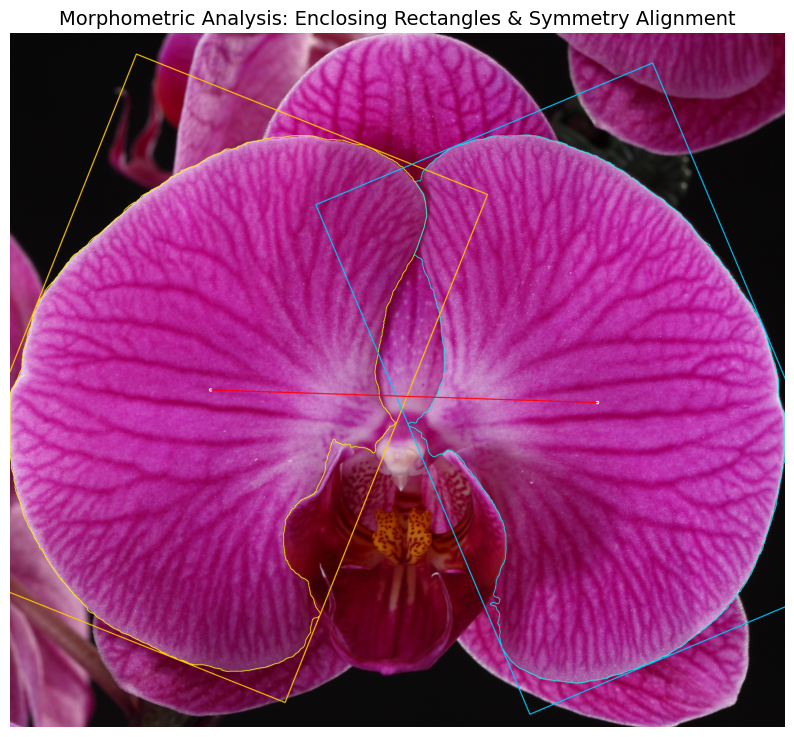

In [70]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# ==========================================
# 1. 讀取影像與遮罩 (請確認路徑)
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/000_image.png' 
mask_path = './raw_images_0302_labeled_7/the7masks/000_mask.png'   

img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
channels = img_rgba.shape[2] if len(img_rgba.shape) == 3 else 1
if channels == 3:
    img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_BGR2RGBA)
elif channels == 1:
    img_rgba = cv2.cvtColor(img_rgba, cv2.COLOR_GRAY2RGBA)

mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
img_rgb_content = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)

# ==========================================
# 2. 定義特徵分析函式
# ==========================================
def analyze_organ(binary_mask):
    """輸入二值化遮罩，回傳最大輪廓的各項幾何特徵"""
    # 進行微幅去雜訊
    kernel = np.ones((5, 5), np.uint8)
    clean_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    
    contours, _ = cv2.findContours(clean_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None
    
    # 取最大的輪廓 (避免小碎點干擾)
    cnt = max(contours, key=cv2.contourArea)
    
    # 1. 面積與周長
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    
    # 2. 圓形度 (Circularity)
    circularity = (4 * np.pi * area) / (perimeter ** 2) if perimeter > 0 else 0
    
    # 3. 最小包覆旋轉矩形 (取得長度、寬度、旋轉角度)
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    box = np.intp(box) # 轉換為整數座標供繪圖使用
    
    rect_w, rect_h = rect[1]
    length = max(rect_w, rect_h)
    width = min(rect_w, rect_h)
    aspect_ratio = length / width if width > 0 else 0
    
    # 4. 幾何中心點 (Centroid)
    M = cv2.moments(cnt)
    cX = int(M["m10"] / M["m00"]) if M["m00"] != 0 else 0
    cY = int(M["m01"] / M["m00"]) if M["m00"] != 0 else 0
    
    return {
        "contour": cnt,
        "area": area,
        "perimeter": perimeter,
        "circularity": circularity,
        "length": length,
        "width": width,
        "aspect_ratio": aspect_ratio,
        "centroid": (cX, cY),
        "bounding_box": box
    }

# ==========================================
# 3. 執行分析：Petal_L (ID:6) vs Petal_R (ID:7)
# ==========================================
mask_L = np.where(mask == 6, 255, 0).astype(np.uint8)
mask_R = np.where(mask == 7, 255, 0).astype(np.uint8)

data_L = analyze_organ(mask_L)
data_R = analyze_organ(mask_R)

# ==========================================
# 4. 視覺化：將幾何特徵畫在原圖上
# ==========================================
result_img = img_rgb_content.copy()

if data_L and data_R:
    # 畫左花瓣 (黃色框線)
    cv2.drawContours(result_img, [data_L["contour"]], -1, (255, 255, 0), 2)
    cv2.drawContours(result_img, [data_L["bounding_box"]], 0, (255, 200, 0), 3) # 最小包覆矩形
    cv2.circle(result_img, data_L["centroid"], 8, (255, 255, 255), -1)
    
    # 畫右花瓣 (青色框線)
    cv2.drawContours(result_img, [data_R["contour"]], -1, (0, 255, 255), 2)
    cv2.drawContours(result_img, [data_R["bounding_box"]], 0, (0, 200, 255), 3)
    cv2.circle(result_img, data_R["centroid"], 8, (255, 255, 255), -1)
    
    # 畫出左右中心點的連線 (紅色虛線效果用實線代替)，用來觀察水平對齊度
    cv2.line(result_img, data_L["centroid"], data_R["centroid"], (255, 0, 0), 3)

    # ==========================================
    # 5. 終端機列印：幾何特徵量化報告
    # ==========================================
    print("\n" + "="*50)
    print(f"{'🌸 左右花瓣 (Petal_L vs Petal_R) 形態學特徵報告':^45}")
    print("="*50)
    print(f"{'指標 (Metrics)':<20} | {'左花瓣 (Left)':<12} | {'右花瓣 (Right)':<12}")
    print("-" * 50)
    print(f"{'面積 (Area)':<20} | {data_L['area']:<12.1f} | {data_R['area']:<12.1f}")
    print(f"{'圓形度 (Circularity)':<17} | {data_L['circularity']:<12.3f} | {data_R['circularity']:<12.3f}")
    print(f"{'物理長度 (Length px)':<16} | {data_L['length']:<12.1f} | {data_R['length']:<12.1f}")
    print(f"{'物理寬度 (Width px)':<16} | {data_L['width']:<12.1f} | {data_R['width']:<12.1f}")
    print(f"{'長寬比 (Aspect Ratio)':<15} | {data_L['aspect_ratio']:<12.3f} | {data_R['aspect_ratio']:<12.3f}")
    print("-" * 50)
    
    # 計算對稱性差異
    area_diff_ratio = abs(data_L['area'] - data_R['area']) / max(data_L['area'], data_R['area']) * 100
    y_offset = abs(data_L['centroid'][1] - data_R['centroid'][1])
    
    print(f"⚖️ 【對稱性評估 (Symmetry Analysis)】")
    print(f"   - 面積差異率: {area_diff_ratio:.2f}% (越接近 0% 越完美對稱)")
    print(f"   - 水平位移差: {y_offset} px (重心 Y 軸的垂直落差)")
    print("="*50 + "\n")

# 顯示結果影像
plt.figure(figsize=(10, 10))
plt.imshow(result_img)
plt.title("Morphometric Analysis: Enclosing Rectangles & Symmetry Alignment", fontsize=14)
plt.axis('off')
plt.show()


             🌿 蘭花生物學中軸與真實生長長度報告              
指標 (Metrics)              | 左花瓣 (Petal_L) | 右花瓣 (Petal_R)
-------------------------------------------------------
中心輻射長度 (距柱頭 px)        | 1424.8         | 1432.7        
花瓣真實長度 (基部到尖端 px)   | 1249.2         | 1282.7        
-------------------------------------------------------
⚖️ 對稱性：左右花瓣真實長度差異率為 2.61%



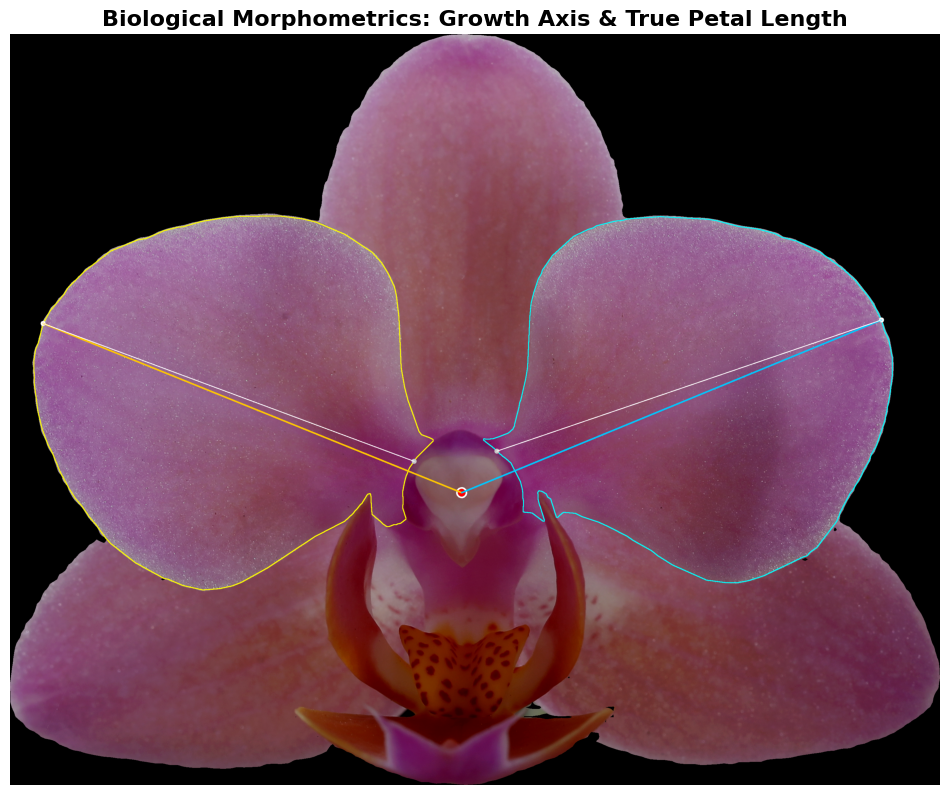

In [77]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# ==========================================
# 1. 讀取影像與遮罩 (請確認路徑)
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/000_009_image.png' 
mask_path = './raw_images_0302_labeled_7/the7masks/000_009_mask.png'   

# 讀取原圖 (預設為 BGR 或 BGRA)
img_raw = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
channels = img_raw.shape[2] if len(img_raw.shape) == 3 else 1

# 直接將影像轉換為標準的 RGB 格式
if channels == 4:
    img_rgb_content = cv2.cvtColor(img_raw, cv2.COLOR_BGRA2RGB)
elif channels == 3:
    img_rgb_content = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
elif channels == 1:
    img_rgb_content = cv2.cvtColor(img_raw, cv2.COLOR_GRAY2RGB)

# 讀取遮罩
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
# ==========================================
# 2. 計算 Class 1 (柱頭) 的幾何中心點
# ==========================================
mask_c1 = np.where(mask == 1, 255, 0).astype(np.uint8)
M_c1 = cv2.moments(mask_c1)
if M_c1["m00"] != 0:
    column_cX = int(M_c1["m10"] / M_c1["m00"])
    column_cY = int(M_c1["m01"] / M_c1["m00"])
    column_centroid = np.array([column_cX, column_cY])
else:
    raise ValueError("找不到 Class 1 (柱頭) 的像素，無法建立生長中軸！")

# ==========================================
# 3. 定義「生物學中軸」分析函式
# ==========================================
def analyze_biological_axis(binary_mask, origin_point):
    """計算從起源點(柱頭)出發的花瓣中軸線與真實長度"""
    kernel = np.ones((5, 5), np.uint8)
    clean_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    
    contours, _ = cv2.findContours(clean_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None
    
    cnt = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(cnt)
    
    # 尋找距離柱頭「最遠」的點 (花瓣尖端 Tip)
    max_dist = 0
    farthest_point = None
    
    # 尋找距離柱頭「最近」的點 (花瓣基部 Base)
    min_dist = float('inf')
    closest_point = None
    
    for pt in cnt:
        p = pt[0]
        # 計算歐式距離
        dist = np.linalg.norm(p - origin_point)
        
        if dist > max_dist:
            max_dist = dist
            farthest_point = tuple(p)
            
        if dist < min_dist:
            min_dist = dist
            closest_point = tuple(p)
            
    # 真實花瓣長度：尖端到基部的直線距離
    true_length = np.linalg.norm(np.array(farthest_point) - np.array(closest_point))
    
    return {
        "contour": cnt,
        "area": area,
        "tip_point": farthest_point,
        "base_point": closest_point,
        "axis_length_from_column": max_dist, # 從柱頭算起的總輻射長度
        "true_petal_length": true_length     # 花瓣本身的真實長度
    }

# ==========================================
# 4. 執行分析：Petal_L (ID:6) vs Petal_R (ID:7)
# ==========================================
mask_L = np.where(mask == 6, 255, 0).astype(np.uint8)
mask_R = np.where(mask == 7, 255, 0).astype(np.uint8)

data_L = analyze_biological_axis(mask_L, column_centroid)
data_R = analyze_biological_axis(mask_R, column_centroid)

# ==========================================
# 5. 視覺化：畫出真正的生長中軸線
# ==========================================
# 為了讓線條更清楚，我們把背景稍微調暗 (原圖與黑色以 7:3 混合)
dark_bg = np.zeros_like(img_rgb_content)
result_img = cv2.addWeighted(img_rgb_content, 0.7, dark_bg, 0.3, 0)

# 畫出柱頭中心點 (紅色大圓點，作為所有生長軸的起點)
cv2.circle(result_img, tuple(column_centroid), 12, (255, 0, 0), -1)
cv2.circle(result_img, tuple(column_centroid), 15, (255, 255, 255), 3)

def draw_petal_features(img, data, color_contour, color_axis):
    if not data: return
    # 1. 畫輪廓
    cv2.drawContours(img, [data["contour"]], -1, color_contour, 2)
    # 2. 標示最遠點 (尖端)
    cv2.circle(img, data["tip_point"], 8, (255, 255, 255), -1)
    # 3. 標示最近點 (基部)
    cv2.circle(img, data["base_point"], 8, (200, 200, 200), -1)
    # 4. 畫出「柱頭 -> 尖端」的生長中軸線 (粗虛線效果用實線代替)
    cv2.line(img, tuple(column_centroid), data["tip_point"], color_axis, 4)
    # 5. 畫出花瓣本身的真實長度線 (基部 -> 尖端) (細實線)
    cv2.line(img, data["base_point"], data["tip_point"], (255, 255, 255), 2)

# 畫左花瓣特徵 (黃色系)
draw_petal_features(result_img, data_L, (255, 255, 0), (255, 200, 0))
# 畫右花瓣特徵 (青色系)
draw_petal_features(result_img, data_R, (0, 255, 255), (0, 200, 255))

# ==========================================
# 6. 終端機列印：生物形態學報告
# ==========================================
print("\n" + "="*55)
print(f"{'🌿 蘭花生物學中軸與真實生長長度報告':^45}")
print("="*55)
print(f"{'指標 (Metrics)':<25} | {'左花瓣 (Petal_L)':<12} | {'右花瓣 (Petal_R)':<12}")
print("-" * 55)
if data_L and data_R:
    print(f"{'中心輻射長度 (距柱頭 px)':<22} | {data_L['axis_length_from_column']:<14.1f} | {data_R['axis_length_from_column']:<14.1f}")
    print(f"{'花瓣真實長度 (基部到尖端 px)':<19} | {data_L['true_petal_length']:<14.1f} | {data_R['true_petal_length']:<14.1f}")
    
    length_diff = abs(data_L['true_petal_length'] - data_R['true_petal_length'])
    length_diff_ratio = (length_diff / max(data_L['true_petal_length'], data_R['true_petal_length'])) * 100
    
    print("-" * 55)
    print(f"⚖️ 對稱性：左右花瓣真實長度差異率為 {length_diff_ratio:.2f}%")
print("="*55 + "\n")

# 顯示結果影像
plt.figure(figsize=(12, 12))
plt.imshow(result_img)
plt.title("Biological Morphometrics: Growth Axis & True Petal Length", fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()


📏 分析結果：
   - 左花瓣角度: -172.31°
   - 右花瓣角度: -16.00°
   - 🌟 花瓣開張夾角: 156.31°


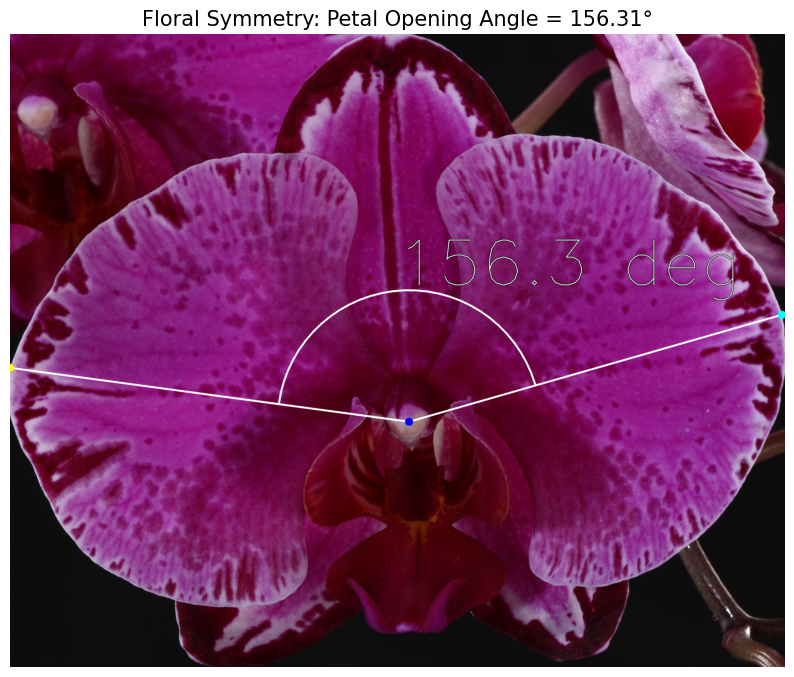

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# ==========================================
# 1. 讀取影像與遮罩
# ==========================================
image_path = './raw_images_0302_labeled_7/the7images/005_image.png' 
mask_path = './raw_images_0302_labeled_7/the7masks/005_mask.png'   

img_rgba = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
img_rgb = cv2.cvtColor(img_rgba, cv2.COLOR_BGRA2RGB)

# ==========================================
# 2. 定義基礎點：柱頭中心 (Origin)
# ==========================================
mask_c1 = np.where(mask == 1, 255, 0).astype(np.uint8)
M = cv2.moments(mask_c1)
if M["m00"] != 0:
    origin = (int(M["m10"] / M["m00"]), int(M["m01"] / M["m00"]))
else:
    raise ValueError("找不到柱頭中心點")

# ==========================================
# 3. 定義獲取尖端點的函式
# ==========================================
def get_tip_point(target_mask, origin_pt):
    contours, _ = cv2.findContours(target_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours: return None
    cnt = max(contours, key=cv2.contourArea)
    
    max_dist = -1
    tip = None
    for pt in cnt:
        dist = np.linalg.norm(pt[0] - origin_pt)
        if dist > max_dist:
            max_dist = dist
            tip = tuple(pt[0])
    return tip

tip_L = get_tip_point(np.where(mask == 6, 255, 0).astype(np.uint8), origin)
tip_R = get_tip_point(np.where(mask == 7, 255, 0).astype(np.uint8), origin)

# ==========================================
# 4. 角度計算 (使用 atan2)
# ==========================================
if tip_L and tip_R:
    # 計算向量角度 (弧度)
    angle_L = math.atan2(tip_L[1] - origin[1], tip_L[0] - origin[0])
    angle_R = math.atan2(tip_R[1] - origin[1], tip_R[0] - origin[0])
    
    # 轉為角度 (degree)
    deg_L = math.degrees(angle_L)
    deg_R = math.degrees(angle_R)
    
    # 計算夾角 (取絕對值並處理跨越 180 度的情況)
    diff_angle = abs(deg_L - deg_R)
    if diff_angle > 180:
        diff_angle = 360 - diff_angle
    
    print(f"\n📏 分析結果：")
    print(f"   - 左花瓣角度: {deg_L:.2f}°")
    print(f"   - 右花瓣角度: {deg_R:.2f}°")
    print(f"   - 🌟 花瓣開張夾角: {diff_angle:.2f}°")

    # ==========================================
    # 5. 視覺化繪圖
    # ==========================================
    viz_img = img_rgb.copy()
    
    # 畫出中軸線 (白色)
    cv2.line(viz_img, origin, tip_L, (255, 255, 255), 5, cv2.LINE_AA)
    cv2.line(viz_img, origin, tip_R, (255, 255, 255), 5, cv2.LINE_AA)
    
    # 畫出節點
    cv2.circle(viz_img, origin, 15, (0, 0, 255), -1)      # 柱頭點 (紅)
    cv2.circle(viz_img, tip_L, 15, (255, 255, 0), -1)     # 左尖端 (黃)
    cv2.circle(viz_img, tip_R, 15, (0, 255, 255), -1)     # 右尖端 (青)
    
    # 畫出角度弧線 (Arc)
    # 決定弧線半徑 (取兩中軸平均長度的 1/3)
    radius = int((np.linalg.norm(np.array(tip_L) - origin) + np.linalg.norm(np.array(tip_R) - origin)) / 6)
    
    # cv2.ellipse 繪製弧線
    # 注意：deg_L 與 deg_R 的順序會決定弧線的方向，我們需要順向繪製
    start_a, end_a = (deg_R, deg_L) if deg_R < deg_L else (deg_L, deg_R)
    if end_a - start_a > 180: # 處理跨越 0 度線的情況
        start_a, end_a = end_a, start_a + 360
        
    cv2.ellipse(viz_img, origin, (radius, radius), 0, start_a, end_a, (255, 255, 255), 5, cv2.LINE_AA)
    
    # 標註角度數值文字
    text_pos = (origin[0] - 50, origin[1] - radius - 20)
    cv2.putText(viz_img, f"{diff_angle:.1f} deg", text_pos, cv2.FONT_HERSHEY_SIMPLEX, 8, (0,0,0), 5, cv2.LINE_AA)
    cv2.putText(viz_img, f"{diff_angle:.1f} deg", text_pos, cv2.FONT_HERSHEY_SIMPLEX, 8, (255,255,255), 2, cv2.LINE_AA)

    plt.figure(figsize=(10, 10))
    plt.imshow(viz_img)
    plt.title(f"Floral Symmetry: Petal Opening Angle = {diff_angle:.2f}°", fontsize=15)
    plt.axis('off')
    plt.show()

[*] 正在生成 20 張影像的檢查清單...


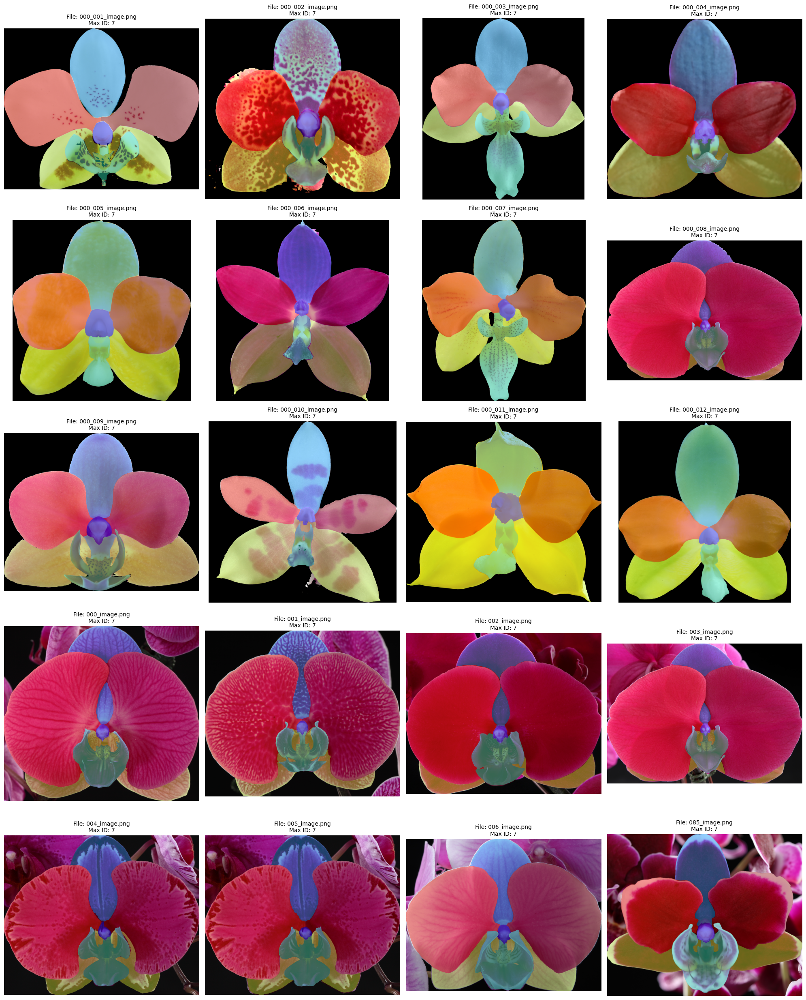

[*] 檢查結束。請確認是否有標記偏移或類別 ID 錯誤的情形。


In [64]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

# ==========================================
# 1. 設定資料夾路徑 (請確認與你之前的設定一致)
# ==========================================
image_dir = './raw_images_0302_labeled_7/the7images/'
mask_dir = './raw_images_0302_labeled_7/the7masks/'

# 取得所有影像路徑
image_paths = sorted(glob.glob(os.path.join(image_dir, '*_image.png')))

if not image_paths:
    print(f"錯誤：在 {image_dir} 找不到任何影像。")
else:
    # ==========================================
    # 2. 設定繪圖網格
    # ==========================================
    num_images = len(image_paths)
    cols = 4
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()

    print(f"[*] 正在生成 {num_images} 張影像的檢查清單...")

    for i, img_path in enumerate(image_paths):
        # 讀取原圖
        filename = os.path.basename(img_path)
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        
        # 讀取對應的 Mask
        mask_filename = filename.replace('_image.png', '_mask.png')
        mask_path = os.path.join(mask_dir, mask_filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        if mask is not None:
            # 將 Mask 轉換為彩色 (使用 JET 顏色對應)
            # 這樣不同的 Class ID (1, 6, 7等) 會顯示不同的顏色
            max_id = np.max(mask) if np.max(mask) > 0 else 1
            mask_norm = (mask * (255 // max_id)).astype(np.uint8)
            mask_color = cv2.applyColorMap(mask_norm, cv2.COLORMAP_JET)
            mask_color = cv2.cvtColor(mask_color, cv2.COLOR_BGR2RGB)
            
            # 疊合原圖與彩色 Mask (比例 6:4)
            overlay = cv2.addWeighted(img_rgb, 0.6, mask_color, 0.4, 0)
            
            # 在沒有標記的地方保留原圖色彩
            overlay[mask == 0] = img_rgb[mask == 0]
            
            axes[i].imshow(overlay)
            axes[i].set_title(f"File: {filename}\nMax ID: {max_id}", fontsize=10)
        else:
            axes[i].text(0.5, 0.5, f"Missing Mask:\n{mask_filename}", 
                         ha='center', va='center', color='red')
            axes[i].set_title(f"Error: {filename}", color='red')
            
        axes[i].axis('off')

    # 隱藏多餘的子圖
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
    print("[*] 檢查結束。請確認是否有標記偏移或類別 ID 錯誤的情形。")

## 切割出 Target Mask 的圖片

In [81]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate as interp
from scipy.linalg import orthogonal_procrustes
from sklearn.decomposition import PCA
import os
import glob

# ==========================================
# 1. 定義 GPA 函數 (維持不變)
# ==========================================
def perform_gpa(shapes, max_iter=10, tol=1e-5):
    N, num_points, dims = shapes.shape
    centers = np.mean(shapes, axis=1, keepdims=True)
    centered_shapes = shapes - centers
    centroid_sizes = np.linalg.norm(centered_shapes, axis=(1, 2), keepdims=True)
    scaled_shapes = centered_shapes / centroid_sizes
    
    aligned_shapes = np.copy(scaled_shapes)
    mean_shape = aligned_shapes[0] 
    
    for iteration in range(max_iter):
        for i in range(N):
            R, _ = orthogonal_procrustes(aligned_shapes[i], mean_shape)
            aligned_shapes[i] = np.dot(aligned_shapes[i], R)
            
        new_mean_shape = np.mean(aligned_shapes, axis=0)
        new_mean_shape /= np.linalg.norm(new_mean_shape)
        
        diff = np.linalg.norm(new_mean_shape - mean_shape)
        mean_shape = new_mean_shape
        if diff < tol:
            print(f"[*] GPA 在第 {iteration+1} 次迭代收斂。")
            break
    return aligned_shapes, mean_shape

# ==========================================
# 2. 設定資料夾路徑與參數
# ==========================================
image_dir = './raw_images_0302_labeled_7/the7images/'
mask_dir = './raw_images_0302_labeled_7/the7masks/'

# 新增：切割後圖片要儲存的地點 (移除了 mask 的儲存資料夾)
out_image_dir = './only_right_petals_images/'
os.makedirs(out_image_dir, exist_ok=True)

target_class_id = 7 
base_class_id = 1   
num_landmarks = 200

padding = 30 # 設定切割時的邊緣緩衝像素(可依需求調整)

all_petals_landmarks = []
valid_filenames = []

# ==========================================
# 3. 執行切割與過濾
# ==========================================
# 抓取 mask_dir 內所有的圖片檔案 (假設為 .png 或 .jpg)
mask_paths = glob.glob(os.path.join(mask_dir, '*.*'))

for mask_path in mask_paths:
    filename = os.path.basename(mask_path)
    image_filename = filename.replace('_mask', '_image')
    image_path = os.path.join(image_dir, image_filename)
    
    if not os.path.exists(image_path):
        print(f"[警告] 找不到對應的原圖: {image_path}")
        continue

    # 讀取圖片與 Mask (Mask 必須以灰階讀取)
    img = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if img is None or mask is None:
        print(f"[警告] 圖片或 Mask 讀取失敗: {filename}")
        continue

    # 找出 target_class_id (7) 在 mask 中的所有 (y, x) 座標
    y_indices, x_indices = np.where(mask == target_class_id)

    # 如果該張圖片沒有 class 7，則跳過
    if len(y_indices) == 0:
        print(f"[提示] {filename} 中找不到 Class {target_class_id}，已跳過。")
        continue

    # 計算 Bounding Box 的最小與最大邊界
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    x_min, x_max = np.min(x_indices), np.max(x_indices)

    # 加入 Padding 並確保不超過原圖長寬限制
    h, w = mask.shape
    y_min = max(0, y_min - padding)
    y_max = min(h, y_max + padding)
    x_min = max(0, x_min - padding)
    x_max = min(w, x_max + padding)

    # 根據計算出的邊界裁切圖片與 Mask
    cropped_img = img[y_min:y_max, x_min:x_max]
    cropped_mask = mask[y_min:y_max, x_min:x_max]

    # ==========================================
    # 【新增功能】套用 Mask 讓背景變黑
    # ==========================================
    # 建立二值化遮罩：等於 target_class_id 的部分設為 255，其餘設為 0
    binary_mask = np.where(cropped_mask == target_class_id, 255, 0).astype(np.uint8)
    
    # 將遮罩套用到裁切後的圖片上
    masked_img = cv2.bitwise_and(cropped_img, cropped_img, mask=binary_mask)

    # 儲存裁切且去背後的結果 (不再存 Mask，且統一用 image_filename 命名)
    out_img_path = os.path.join(out_image_dir, image_filename)
    cv2.imwrite(out_img_path, masked_img)

    valid_filenames.append(image_filename)
    print(f"[成功] {image_filename} 已成功裁切、去背並儲存。")

print(f"\n--- 處理完成 ---")
print(f"共成功處理 {len(valid_filenames)} 張圖片。")

[警告] 圖片或 Mask 讀取失敗: Thumbs.db
[成功] 000_image.png 已成功裁切、去背並儲存。
[成功] 001_image.png 已成功裁切、去背並儲存。
[成功] 002_image.png 已成功裁切、去背並儲存。
[成功] 003_image.png 已成功裁切、去背並儲存。
[成功] 004_image.png 已成功裁切、去背並儲存。
[成功] 005_image.png 已成功裁切、去背並儲存。
[成功] 006_image.png 已成功裁切、去背並儲存。
[成功] 085_image.png 已成功裁切、去背並儲存。
[成功] 000_012_image.png 已成功裁切、去背並儲存。
[成功] 000_001_image.png 已成功裁切、去背並儲存。
[成功] 000_002_image.png 已成功裁切、去背並儲存。
[成功] 000_003_image.png 已成功裁切、去背並儲存。
[成功] 000_010_image.png 已成功裁切、去背並儲存。
[成功] 000_004_image.png 已成功裁切、去背並儲存。
[警告] 找不到對應的原圖: ./raw_images_0302_labeled_7/the7images/000_005_image.png
[成功] 000_006_image.png 已成功裁切、去背並儲存。
[成功] 000_011_image.png 已成功裁切、去背並儲存。
[成功] 000_007_image.png 已成功裁切、去背並儲存。
[成功] 000_008_image.png 已成功裁切、去背並儲存。
[成功] 000_009_image.png 已成功裁切、去背並儲存。

--- 處理完成 ---
共成功處理 19 張圖片。


In [79]:
!ls

@eaDir		  floweral_seperate.ipynb	  raw_images_0302_labeled_7
Card_detect	  main-quantification.ipynb	  raw_images_2026
Phal_cropforjson  only_right_petals_images	  raw_yolo_sam.ipynb
Phal_process	  only_right_petals_images_masks  visualize_attention.ipynb
dinov2		  procruste.ipynb
dinov3		  raw_images_0302
